<a href="https://colab.research.google.com/github/SudeepSarkar/sarkar-computer-vision-lectures/blob/main/CV_Module_8_3_Depth_from_2_views_unknown_camera_calibration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

(c) Copyright Sudeep Sarkar, University of South Florida


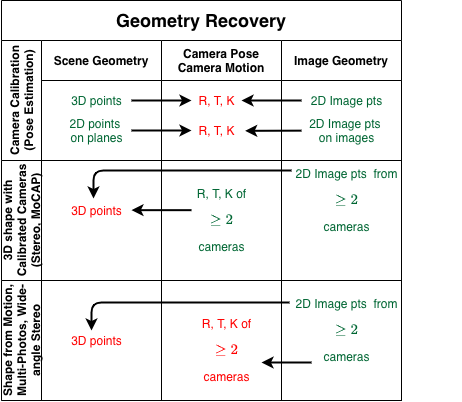

# 3D geometry from pairs of images taken from different viewpoints


1. Different cameras at different locations, scene (largely) fixed (multi-view, stereo, etc.): 

>> Large scale 3D reconstruction from internet photos https://www.cs.cornell.edu/projects/bigsfm/

2. Moving camera, scene (mostly) fixed: 

>> Augmented/mixed reality, e.g. surgery. https://www.youtube.com/watch?v=YewU-BxDxBE

>> Simultaneous localization and mapping (SLAM) https://www.youtube.com/watch?v=ZR1yXFAslSk

3. Camera fixed (maybe with pan/tilt), Objects in the scene are moving (scene monitoring, e.g., wildlife, public spaces for security)

>>https://explore.org/livecams/african-wildlife/african-river-wildlife-camera

4. Moving camera(s), Largely constant scene, but with moving objects (self-driving cars)

>> Waymo data https://waymo.com/open/

>> Nuscenes data https://www.nuscenes.org/

>> Lyft data https://self-driving.lyft.com/level5/data/


# Sketch of a solution

1. Calibrate for intrinsic parameters, $\mathbf{K_j}$, for each camera. (covered earlier)
2. Establish correspondences between pairs of images based on photometric measures, such as done in SIFT. (covered earlier)
3. Estimate essential matrix $\mathbf{E}$.
4. Estimate $\mathbf{t}$ from $\mathbf{E}$.
5. Estimate $\mathbf{R}$ from $\mathbf{E}$.
6. Given $\mathbf{R}$, $\mathbf{t}$, and $\mathbf{K_j}$, we can estimate the 3D using methods described in previous lecture (covered earlier)

##Code: imported packages

In [ ]:
import numpy as np
import torch

import matplotlib.pyplot as plt
import scipy.ndimage as scimage
from skimage.transform import warp
import torch.nn as nn
from skimage import io

!pip install opencv-contrib-python==4.4.0.44
import cv2
print (cv2 .__version__)

!pip install xmltodict
import xmltodict
from scipy.spatial.transform import Rotation 

np.set_printoptions(precision=4, suppress=True)
torch.set_printoptions(precision=4, sci_mode=False)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
4.4.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
data_dir = '/content/drive/MyDrive/Colab Notebooks/CAP 6415 Computer Vision Online/data/'

Mounted at /content/drive


## Code: `compute_essential_fundamental_matrices`

In [ ]:
# Compute essential and fundamental matrices from R, T, K matrices that are returned from calibration
def compute_essential_fundamental_matrices (R_left, T_left, K_left, R_right, T_right, K_right) :
    ''' Compute the transformation (R, T) that takes a point from left camera to the right camera
        from the given camera calibraton parameters, which take a point from the world coordinates into
        the invidual camera coordinates. It returns E and F matrices.'''
    R_lr =  R_right @ np.transpose(R_left) # rotation matrix to align a pt in left image to right image
    T_r =  T_right - R_lr @ T_left   # translation vector to the left camera from the right camera, with respect to the right camera 

    '''Epipolar constraint matrix (Essential matrix)'''
    E = np.zeros((3,3))
    E[:,0] = np.cross(T_r, R_lr[:,0]) # essential matrix
    E[:,1] = np.cross(T_r, R_lr[:,1])
    E[:,2] = np.cross(T_r, R_lr[:,2])

    ''' Fundamental matrices -- to express in terms of array coordinates '''
    K_left_inv = np.linalg.inv(K_left)
    K_right_inv = np.linalg.inv(K_right)
    F = np.transpose(K_right_inv) @ E @ K_left_inv  # Fundamental matrix -- includes intrinsic parameters
    return (E, F, R_lr, T_r)

##Code: `epipolar_lines`

In [ ]:
# Code to compute epipolar lines corresponding to a given point in the left image.

def epipolar_lines (F, point_left_h, point_right_h, image_left_size, image_right_size) :
    '''Returns the right and left epipolar line coordinates for point_left and point_right, respectively.  
        F is 3 by 3. points_left and points_right  are 2 by 1. It returns two sets of lines: 
        (i) epipolar line in the left image based for point_right in the right image and
        (ii) the epipolar line in the right image corresponding point_left in the left image.'''

    if (point_left_h.shape[0] != 3) : # if the points are not passed in homogeneous representation
        point_left_h = np.row_stack ((point_left_h, [1])) # homogenous represention
        point_right_h = np.row_stack ((point_right_h, [1])) # homogenous represention

    line_right = F @ point_left_h # homogenous coordinates of the epipolar line, line_right is 3 by 1

    # Coordinates of the epipolar line on right image for the point p_right
    x_right = np.arange(0, image_right_size[1]) # uniformly spread x coordinates
    y_right = (-line_right[0]*x_right - line_right[2])/line_right[1] # corresponding y-coordinates
    # select only the part of the line that falls within the image
    x_right = x_right[(y_right[:] > 0),]; 
    y_right = y_right[(y_right[:] > 0),];
    x_right = x_right[(y_right[:] < image_right_size[0]),] 
    y_right = y_right[(y_right[:] < image_right_size[0]),]
    
    line_left = (point_right_h.transpose() @ F).transpose()

    # Coordinates of the epipolar line on left image for the point p_right
    x_left = np.arange(0, image_left_size[1])
    y_left = (-line_left[0]*x_left - line_left[2])/line_left[1]
    # select only the part of the line that falls within the image
    x_left = x_left[(y_left[:] > 0),]; 
    y_left = y_left[(y_left[:] > 0),];
    x_left = x_left[(y_left[:] < image_left_size[0]),] 
    y_left = y_left[(y_left[:] < image_left_size[0]),]

    if (x_right.any()) :
        if (x_left.any()) :
            return(x_left, y_left, x_right, y_right)
    return(np.array([]), np.array([]), np.array([]), np.array([]))       

##Code: plot_epipolar

In [ ]:
# Draw epipolar lines.
def plot_epipolar (F_mat, image_left, image_right, X_left, X_right, ax) :
    # X_left, X_right are 3 by N dimension list of corresponding points

    r = np.random.random([X_left.shape[1],])
    b = np.random.random([X_left.shape[1],])
    g = np.random.random([X_left.shape[1],])

    ax[0].imshow(image_left, 'gray')
    ax[1].imshow(image_right, 'gray')
    for i in range(X_left.shape[1]) :
        ax[0].plot(X_left [0, i], X_left [1, i], 'o', color=(r[i], g[i], b[i]))
        ax[1].plot(X_right[0, i], X_right[1, i], 'o', color=(r[i], g[i], b[i]))
        x_1, y_1, x_2, y_2 = epipolar_lines (F_mat, X_left[:, i][:,None], X_right[:, i][:,None], image_left.shape, image_right.shape)
        if (x_1.any()) :
            ax[1].plot(x_2, y_2, linewidth=2, color=(r[i], g[i], b[i]))
            ax[0].plot(x_1, y_1, linewidth=2, color=(r[i], g[i], b[i]))


##Code: Read calibration information of WILDTRACK dataset

"[WILDTRACK: A Multi-Camera HD Dataset for Dense Unscpted Pedestrian Detection](https://openaccess.thecvf.com/content_cvpr_2018/html/Chavdarova_WILDTRACK_A_Multi-Camera_CVPR_2018_paper.html)," Tatjana Chavdarova, Pierre Baqué, Stéphane Bouquet, Andrii Maksai, Cijo Jose, Timur Bagautdinov, Louis Lettry, Pascal Fua, Luc Van Gool, François Fleuret; Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR), 2018, pp. 5030-5039 

The full dataset is available at https://www.epfl.ch/labs/cvlab/data/data-wildtrack/


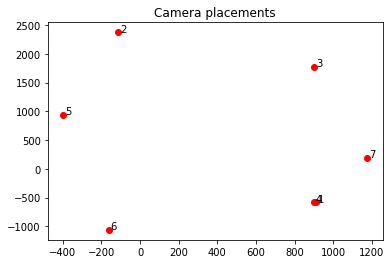

In [ ]:
# Read calibration data of the WILDTRACK dataset. There are seven cameras arranged around an outdoor space.
calib_dir = data_dir+'/Wildtrack/calibrations/'
extrinsic_calibration_files = ['extrinsic/extr_CVLab1.xml', 'extrinsic/extr_CVLab2.xml', 'extrinsic/extr_CVLab3.xml',
                               'extrinsic/extr_CVLab4.xml', 'extrinsic/extr_IDIAP1.xml', 'extrinsic/extr_IDIAP2.xml',
                               'extrinsic/extr_IDIAP3.xml']
intrinsic_calibration_files = ['intrinsic_zero/intr_CVLab1.xml', 'intrinsic_zero/intr_CVLab2.xml', 'intrinsic_zero/intr_CVLab3.xml',
                               'intrinsic_zero/intr_CVLab4.xml', 'intrinsic_zero/intr_IDIAP1.xml', 'intrinsic_zero/intr_IDIAP2.xml',
                               'intrinsic_zero/intr_IDIAP3.xml']
R_list = [] # list of rotations, w.r.t individual cameras
T_list = [] # list of translations, w.r.t individual cameras
K_list = [] # list of intrinsic parameters for individual cameras
c_list = [] # list of camera locations w.r.t world coordinates
for i in range(7) :
    #read extrinsic parameters
    extr_file = calib_dir + extrinsic_calibration_files[i]
    xml_data = open(extr_file, 'r').read()  # Read data
    xmlDict = xmltodict.parse(xml_data)  # Parse XML
    rot_rodriges = np.fromstring(xmlDict['opencv_storage']['rvec'], sep=' ')
    R = Rotation.from_rotvec(rot_rodriges).as_matrix()
    R_list.append(R)
    T = np.fromstring(xmlDict['opencv_storage']['tvec'], sep=' ')
    T_list.append(T)
    c_list.append(-np.transpose(R_list[i]) @ T_list[i][:,None])
    plt.title('Camera placements')
    plt.plot(c_list[i][0], c_list[i][1], 'ro')
    plt.text(c_list[i][0]+10, c_list[i][1]+10, '{}'.format(i+1))

    # read intrinsic parameters
    intr_file = calib_dir + intrinsic_calibration_files[i]
    xml_data = open(intr_file, 'r').read()  # Read data
    xmlDict = xmltodict.parse(xml_data)  # Parse XML
    K_mat = np.fromstring(xmlDict['opencv_storage']['camera_matrix']['data'], sep=' ').reshape(3,3)
    K_list.append(K_mat)
    
#print('Rotation matrices=\n', R_list)
#print('Translation vectors=\n', T_list)
#print('Intrnsic matrices=\n', K_list)
#print('Camera centers=\n', c_list)

## Code: Detect and match SIFT keypoints between two images

In [ ]:
def detect_and_match_keypoints (image_1, image_2) :
    # input are just two images
    # returns SIFT key points and descriptors for each image along with sorted match list (plus pairs of point matching coordinates) 
    # SIFT with default parameters
    sift = cv2.SIFT_create(nOctaveLayers = 3, contrastThreshold = 0.04, edgeThreshold = 10, sigma = 1.6)

    keypoints_1, descriptors_1 = sift.detectAndCompute(image_1, None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(image_2, None)

    # FEATURE MATCHING
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    matches = bf.match(descriptors_1, descriptors_2)
    matches = sorted(matches, key = lambda x:x.distance)
    X_1 = []
    X_2 = []
    for i in range(len(matches)) :
        X_1.append([keypoints_1[matches[i].queryIdx].pt[0], keypoints_1[matches[i].queryIdx].pt[1]])
        X_2.append([keypoints_2[matches[i].trainIdx].pt[0], keypoints_2[matches[i].trainIdx].pt[1]])
    X_1 = np.array(X_1)
    X_2 = np.array(X_2)

    return(X_1, X_2, keypoints_1, keypoints_2, matches)

## Code: SIFT keypoint detection and matching

Images downscaled from: (1080, 1920, 3) (1080, 1920, 3)
                    to: (270, 480, 3) (270, 480, 3)


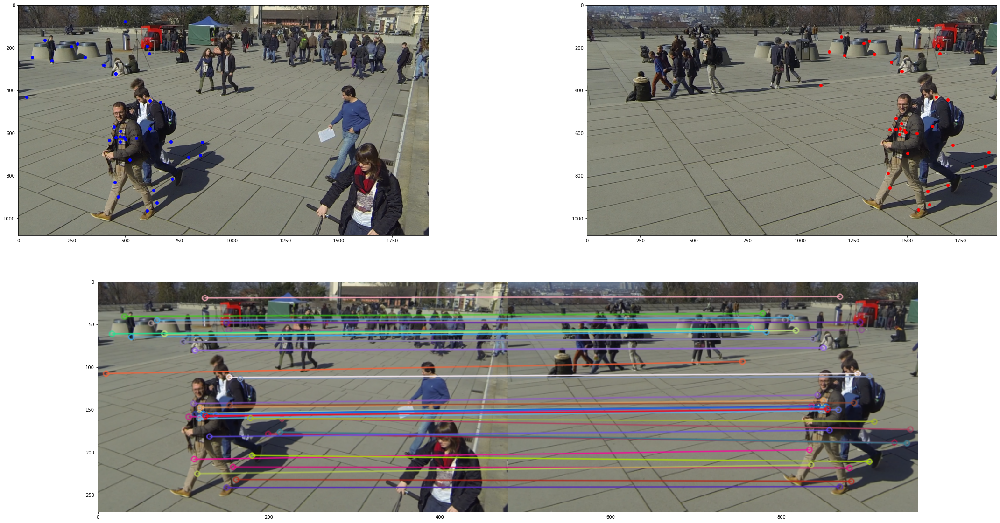

In [ ]:
from skimage.transform import warp, rescale, resize
from skimage import io
from skimage.util import img_as_ubyte

''' Read in the images '''
Cam = ['C1', 'C2', 'C3', 'C4', 'C5','C6','C7']

c0 = 0  #(left image)
c1 = 3  #(right image)
image_0 = io.imread(data_dir+'Wildtrack/'+Cam[c0]+'/00000015.png')
image_1 = io.imread(data_dir+'Wildtrack/'+Cam[c1]+'/00000015.png')

# the openCV SIFT detector works best with images of size around 256 by 256 so we downscale
# to detect and match the features and then scale the location s of the pixels up.
down_scale = 0.25
down_size = (down_scale*image_0.shape[0], down_scale*image_0.shape[1])
image_0_rescaled = resize(image_0, down_size, anti_aliasing=True)
image_1_rescaled = resize(image_1, down_size, anti_aliasing=True)

print ('Images downscaled from:', image_0.shape, image_1.shape)
print ('                    to:', image_0_rescaled.shape, image_1_rescaled.shape)

image_0_rescaled = img_as_ubyte(image_0_rescaled) # OpenCV expects images with (unsigned byte) pixel values between 0 and 255
image_1_rescaled = img_as_ubyte(image_1_rescaled) # skimage changes the read in image to have pixel values between 0 and 1

# detect and match SIFT points
X_0, X_1, keypoints_0, keypoints_1, matches = detect_and_match_keypoints (image_0_rescaled, image_1_rescaled)

num_matches = 40 # select only the best num_matches matches
X_0 = X_0[:num_matches,:]/down_scale
X_1 = X_1[:num_matches,:]/down_scale


#----------------------------------Display-------------------------------------------------------
# draw matches on images for visualization
match_image = cv2.drawMatches(image_0_rescaled, keypoints_0, image_1_rescaled, keypoints_1, matches[:num_matches], image_1_rescaled, flags=2)

plt.figure(figsize=(40,20))
plt.subplot(221)
plt.imshow(image_0)
plt.plot(X_0[:,0], X_0[:,1], 'bo')
plt.subplot(222)
plt.imshow(image_1)
plt.plot(X_1[:,0], X_1[:,1], 'ro')
plt.subplot(212)
plt.imshow(match_image);

##Code: plot calibrated epipolar lines

Left camera: C1 (index 0) 
Right Camera: C4 (index 3)
Essential matrix (calibrated, ground truth):
 [[ 5.9448 10.1736 -7.812 ]
 [-6.9039  0.8946 -9.8714]
 [ 8.3612  3.9693  4.4239]]
Fundamental matrix (calibrated, ground truth):
 [[ 0.      0.     -0.0079]
 [-0.      0.     -0.0037]
 [ 0.004  -0.0012  8.7071]]


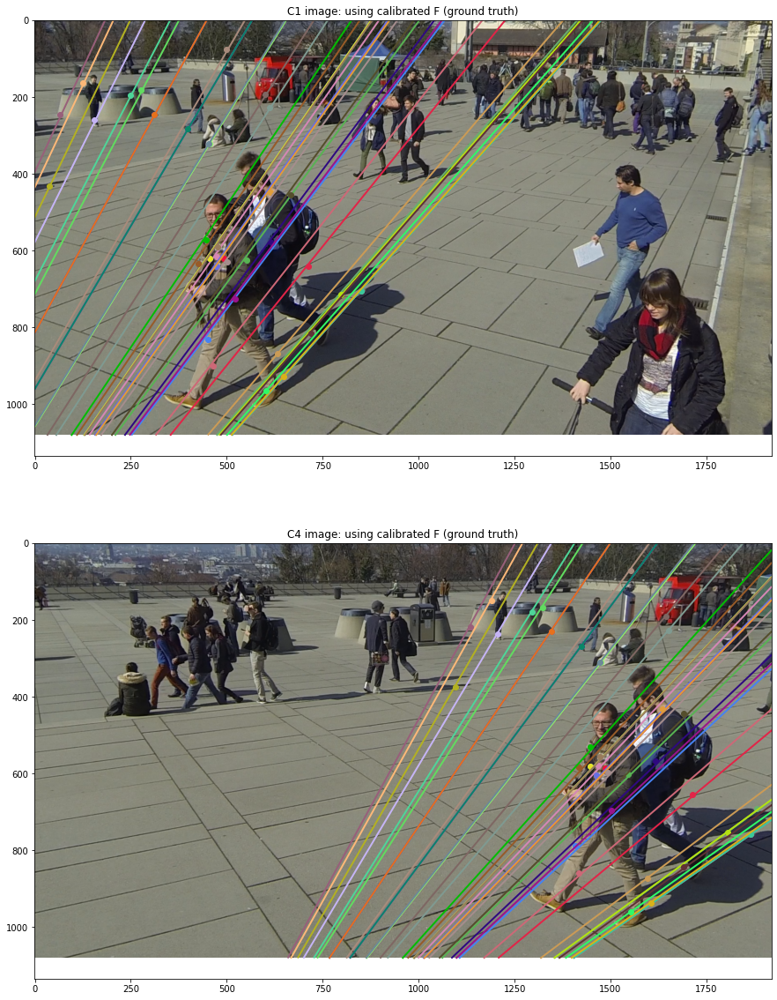

In [ ]:
print('Left camera: {} (index {}) \nRight Camera: {} (index {})'.format(Cam[c0], c0, Cam[c1], c1))
E_calib, F_calib, R_calib, T_calib = compute_essential_fundamental_matrices (R_list[c0], T_list[c0], K_list[c0], R_list[c1], T_list[c1], K_list[c1])
print('Essential matrix (calibrated, ground truth):\n', E_calib)
print('Fundamental matrix (calibrated, ground truth):\n', F_calib)

#-----------------------------------------------------------------------------------------
# Some manually marked corresponding points for frame 15 in videos from camera C1 and C4
#X_C1 = np.array([[261, 862], [186, 837], [122, 813], [328, 642], [270, 629], [168, 602], [119, 589],   [467, 626], [527, 654], [587, 467], [539, 489], [429, 1014], [643, 972],  [468, 522],  [831, 401],  [555, 163],  [570, 358],  [508, 276],  [408, 290], [510, 161], [735, 317], [710,547]])
#X_C4 = np.array([[1234, 781], [1175, 745], [1125, 712], [1318, 596], [1267, 574], [1182, 537], [1144, 518] ,   [1458, 589], [1514, 626], [1602, 448], [1544, 469], [1371, 961], [1594, 977], [1471, 484], [1881, 432], [1604, 152], [1598, 336], [1536, 267], [1432, 283],[1551, 154],[1781,328], [1728, 548]])
#X_0 = X_C1 
#X_1 = X_C4 

X_0_h = np.row_stack((X_0.transpose(), np.ones((1, X_0.shape[0])))) # 3 by N
X_1_h = np.row_stack((X_1.transpose(), np.ones((1, X_1.shape[0])))) # 3 by N


fig, ax = plt.subplots(2, 1)
fig.set_size_inches(20, 20)
ax[0].set_title (Cam[c0]+' image: using calibrated F (ground truth)')
ax[1].set_title (Cam[c1]+' image: using calibrated F (ground truth)')

plot_epipolar (F_calib, image_0, image_1, X_0_h, X_1_h, ax)

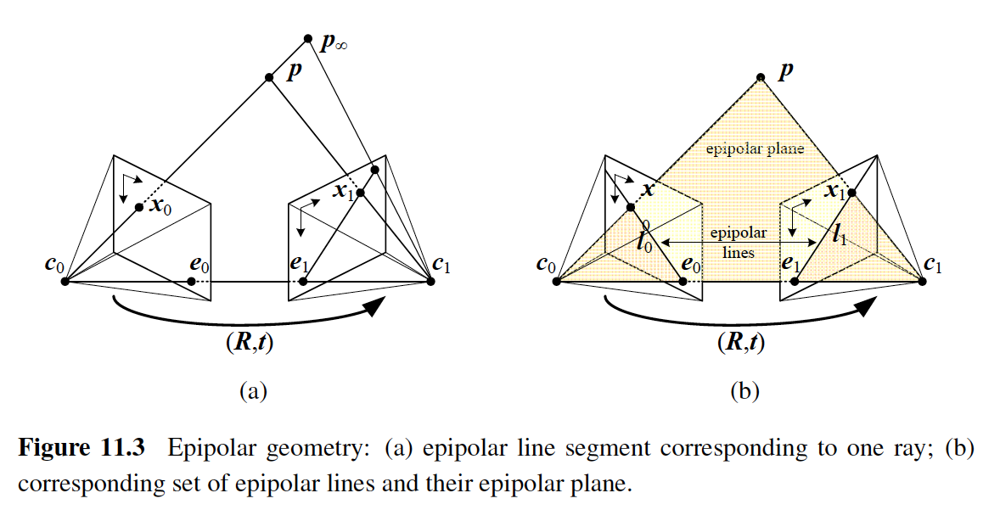

# Recall: relationship between fundamental matrix and essential matrix.

* Recall the equations for the essential matrix, fundamental matrix, and the relationship between them.

\begin{eqnarray}
\mathbf{E} & = & \mathbf{t} \times \mathbf{R} \\
\hat{\mathbf{x}}_1^T \mathbf{E} \hat{\mathbf{x}}_0 & = & 0 \\
\mathbf{\tilde{x}}_1^T \mathbf{F} \mathbf{\tilde{x}}_0 & = & 0\\
    \mathbf{F} & = & \mathbf{K_1}^{-T} \mathbf{E} \mathbf{K_0}^{-1}\\
    \mathbf{E} & = & \mathbf{K_1}^{T} \mathbf{F} \mathbf{K_0}\\
\end{eqnarray}

* $\mathbf{\hat{x}}_j = \mathbf{K}_j^{-1} \mathbf{\tilde{x}}_j$ is the ray from the camera center to the pixel and out to the world, with respect to the *local* camera coordinates. Note that we need to know the intrinsic camera parameters.

* Note that the fundamental matrix involves the intrinsic parameters and the extrinsic parameters, whereas the essential matrix involves the extrinsic parameters. 

*  It is **not** possible to recover the extrinsic parameters just from the fundamental matrix; we have too many unknowns (4+3+3) combined to form 9 entries of the fundamental matrix. 

* **We need the essential matrix, i.e., we need the cameras' intrinsic calibration parameters.**


#3. Estimating $\mathbf{E}$

* Convert the image array based coordinates into coordinates with respect to the optic center (typically, middle of the image array). 
\begin{eqnarray}
\mathbf{\hat{x}}_0 & = & \mathbf{K}_0^{-1} \mathbf{\tilde{x}}_0\\
\mathbf{\hat{x}}_1 & = & \mathbf{K}_1^{-1} \mathbf{\tilde{x}}_1
\end{eqnarray}
* The constraint between the corresponding points, which are specified with respect to the center of the image (camera coordinates) in the two views, is:
\begin{eqnarray}
    \begin{bmatrix}
    \hat{x}_1 & \hat{y}_1 & 1
    \end{bmatrix}
     \begin{bmatrix}
     e_{00} & e_{01} & e_{02} \\
     e_{10} & e_{11} & e_{12} \\
     e_{20} & e_{21} & e_{22}
     \end{bmatrix}
     \begin{bmatrix}
    \hat{x}_0 \\  \hat{y}_0 \\ 1
    \end{bmatrix} & = & 0
\end{eqnarray}

* Multiplying the matrices, we have one equation per corresponding point pairs.

\begin{equation}
    (\hat{x}_0 \hat{x}_1) e_{00} + (\hat{y}_0 \hat{x}_1) e_{01} + \hat{x}_1 e_{02}  +
    (\hat{x}_0 \hat{y}_1) e_{10} + (\hat{y}_0 \hat{y}_1) e_{11} + \hat{y}_1 e_{12}  +
    \hat{x}_0 e_{10} + \hat{y}_0 e_{11} +  e_{12}   = 0
\end{equation}

* Given $N$ pairs of correspondences, we will have $N$ linear equations to solve.

\begin{equation}
    \begin{bmatrix}
    \vdots & \vdots &\vdots & \vdots & \vdots &\vdots & \vdots & \vdots & \vdots \\
    \vdots & \vdots &\vdots & \vdots & \vdots &\vdots & \vdots & \vdots & \vdots \\
    (\hat{x}_0 \hat{x}_1) & (\hat{y}_0 \hat{x}_1) & \hat{x}_1 &
    (\hat{x}_0 \hat{y}_1) & (\hat{y}_0 \hat{y}_1) & \hat{y}_1 &
    \hat{x}_0 & \hat{y}_0 &  1  \\
    \vdots & \vdots &\vdots & \vdots & \vdots &\vdots & \vdots & \vdots & \vdots \\
    \vdots & \vdots &\vdots & \vdots & \vdots &\vdots & \vdots & \vdots & \vdots \\
    \end{bmatrix}
    \begin{bmatrix}
 e_{00} \\ e_{01} \\ e_{02} \\
     e_{10} \\ e_{11} \\ e_{12} \\
     e_{20} \\ e_{21} \\ e_{22}
\end{bmatrix} = 0
\end{equation}

* Or equivalently, we have to solve the following linear equation. Note the uncertainty concerning the scaling of the solution. (We have seen equations like this before, and you should be able to sketch out at least three ways to solve this.)

\begin{eqnarray}
\mathbf{A}^{N\times 9} \mathbf{e}^{9\times 1} & = & 0 \\
\end{eqnarray}


---

\begin{eqnarray}
\mathbf{A}^{N\times 9} \mathbf{e}^{9\times 1} & = & 0 \\
\min || \mathbf{A} \mathbf{e}||^2  \\
\min (\mathbf{A} \mathbf{e})^T \mathbf{A} \mathbf{e} \\
\min \mathbf{e}^T (\mathbf{A}^T \mathbf{A})^{9 \times 9} \mathbf{e} 
\end{eqnarray}

* To avoid the degenerate solution, $\mathbf{e} = 0$  we add the constraint that $||\mathbf{e}|| = 1$. Note that we can recover the vector $\mathbf{e}$ only upto a scale.

* So the minimization problem, using Lagrange multipliers, can be expressed as  
\begin{eqnarray}
    \min \mathbf{e}^T (\mathbf{A}^T \mathbf{A}) \mathbf{e} + \lambda (1 - \mathbf{e}^T \mathbf{e})
\end{eqnarray}

* Taking the derivative of the above with respect to $\mathbf{e}$ and setting it to zero, we have

\begin{eqnarray}
    (\mathbf{A}^T \mathbf{A}) \mathbf{e}  = \lambda \mathbf{e}
\end{eqnarray}

* Solution is the eigenvector corresponding to the smallest eigenvalue of $\mathbf{A}^T \mathbf{A}$.

----


## Code: `estimate_essential_from_all_correspondences`

In [ ]:
import scipy.sparse.linalg

def estimate_essential_from_all_correspondences (X0_tilde, K_0, X1_tilde, K_1) :
    # X0_tilde, X1_tilde = 3 by N arrays of homogeneous coordinates of the corresponding points. Each column is (x, y, 1)
    # K_0 and K_1 are 3 by 3 intrinsic parameters of the cameras

    X0_hat = np.linalg.inv(K_0) @ X0_tilde 
    X1_hat = np.linalg.inv(K_1) @ X1_tilde 
    A = np.zeros((X0_hat.shape[1], 9)) # is a N by 9 matrix, each row is for one correspondence
    for i in range(X0_hat.shape[1]) : # loop over the correspondences
        # set each row for each correspondence: 
        # [x1, y1, 1]^T @ [x0, y0, 1] is 3 by 3 matrix which we reshape into a row.
        A[i,:] = (X1_hat[:, i][:,None] @ X0_hat[:, i][None, :]).reshape(1,9) 

    A_T_A = A.transpose() @ A  # 9 by 9 matrix
    vals, vecs = scipy.sparse.linalg.eigs(A_T_A, k=1, which='SM')
    #print('Minimum singular value', np.real(vals[0]))
    E = np.real(vecs)

    return(E.reshape(3,3), np.real(vals[0])) 
    # returns the E estimate and the norm error value achieved

## Code: Using all points -- does not result in good estimate

* Note: The estimate of $\mathbf{E}$ is not good if we use all the points. This is the case even when there are no outlier correspondences, as is the case with our correspondence set. 

* The reason for this is that the metric used to estimate was not geometrically meaningful. (Can you recall what that metric was? This is your next exercise!)

Essential matrix estimation norm error:  1.0666998257717897e-06

NOTE: E and F can be recovered only upto a scale. So we have scaled it to match one entry of the true matrices
E (calibrated)=
 [[ 5.9448 10.1736 -7.812 ]
 [-6.9039  0.8946 -9.8714]
 [ 8.3612  3.9693  4.4239]] 
E_est (upto a scale)=
 [[-0.1547 -0.6509  0.1138]
 [ 0.6721 -0.079   0.2053]
 [-0.0804  0.1698 -0.0633]]

F (calibrated, normalized)=
 [[ 0.      0.     -0.0009]
 [-0.      0.     -0.0004]
 [ 0.0005 -0.0001  1.    ]] 
F_est (normalized)=
 [[ 0.      0.     -0.0009]
 [-0.      0.      0.0003]
 [ 0.0005 -0.0014  1.    ]]


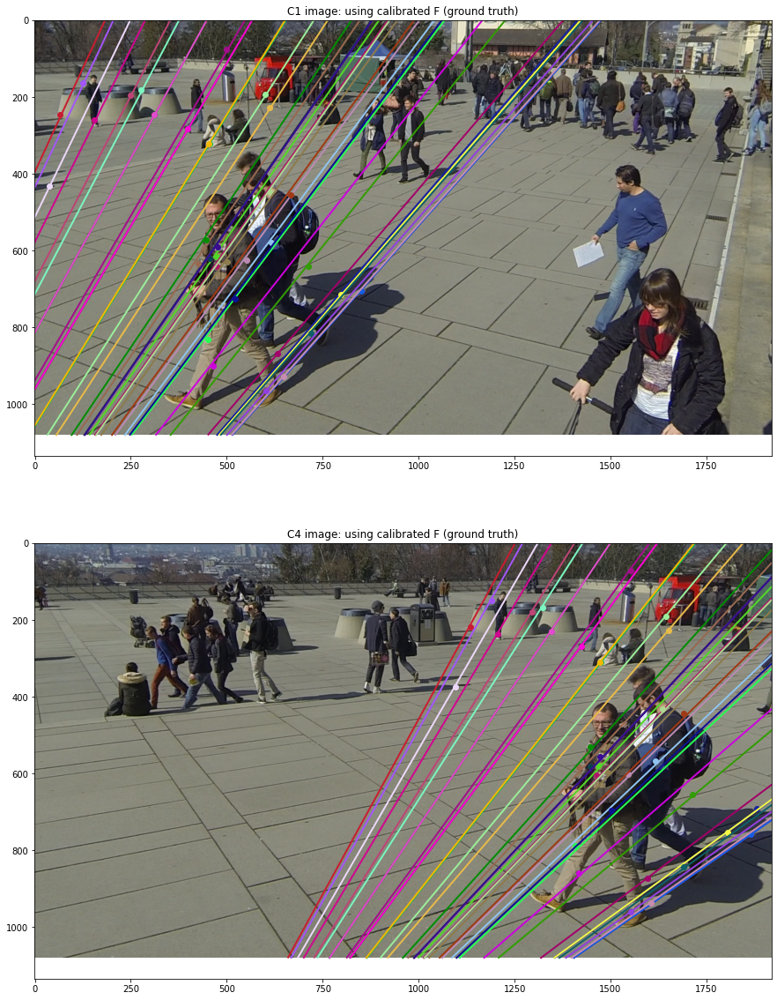

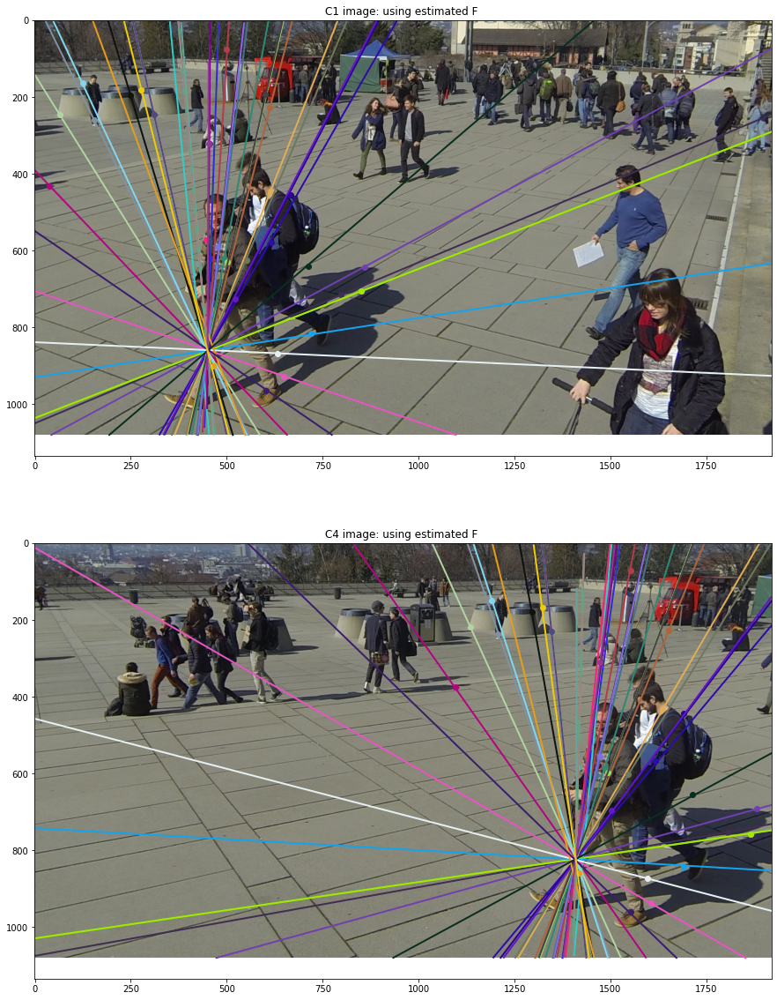

In [ ]:
E_norm, norm_error = estimate_essential_from_all_correspondences (X_0_h, K_list[c0], X_1_h, K_list[c1])
F_norm = np.linalg.inv(K_list[c1]).transpose () @ E_norm @ np.linalg.inv(K_list[c0])

print('Essential matrix estimation norm error: ', norm_error)

print('\nNOTE: E and F can be recovered only upto a scale. So we have scaled it to match one entry of the true matrices')
print('E (calibrated)=\n', E_calib, '\nE_est (upto a scale)=\n', E_norm)
print('\nF (calibrated, normalized)=\n', F_calib/F_calib[2,2], '\nF_est (normalized)=\n', F_norm/F_norm[2,2])

fig, ax = plt.subplots(2, 1)
fig.set_size_inches(20, 20)
ax[0].set_title ('C1 image: using calibrated F (ground truth)')
ax[1].set_title ('C4 image: using calibrated F (ground truth)')
plot_epipolar (F_calib, image_0, image_1, X_0_h, X_1_h, ax)

fig, ax = plt.subplots(2, 1)
fig.set_size_inches(20, 20)
ax[0].set_title ('C1 image: using estimated F ')
ax[1].set_title ('C4 image: using estimated F ')
plot_epipolar (F_norm, image_0, image_1, X_0_h, X_1_h, ax)

# Exercise: Error metric

The reason why the epipolar estimate is poor even though the metric optimized achieves low value is because the metric used is not geometrically meaningful. Write out the mathematical expression of the metric that was optimized. Is it optimizing anything geometrically meaningful?



## Code: Fit quality metric - distance from epipolar lines

A good metric to use are distances of points from the corresponding epiolar lines that were determined by the corresponding point in the other image, and vice-versa.



In [ ]:
def compute_epipolar_fit_error (F, X0_h, X1_h) :
    # Compute total squared distance of the points X0_h and X1_h from the corresponding
    # epipolar lines. The points are specified in homogeneous coordinates
    # X0_h and X1_h are 3 by N sized arrays.
    # F: 3 by 3 fundamental matrix
   
    # First compute error is based on the right (second) image
    lines_right = F @ X0_h  # 3 by N 
    # normalize the line homogenous coordinates so that we can easily compute perpendicular
    # distance from it using a dot product. For mathematical background about how to compute
    # perpendicular distance of a point to a line in homogenous coordinates, see
    # https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/BEARDSLEY/node2.html
    norm_factors = np.sqrt(lines_right[0,:]**2 + lines_right[1,:]**2) # 1 by N
    lines_right /= norm_factors # broadcasting used to 3 by N
    d = (X1_h * lines_right).sum(axis=0) # 1 by N - * and sum to compute dot product of the between the point and the normalized line:
    d1 = (d**2).sum() # average root-squared (Euclidean) distance

    # Second compute error is based on the left (first) image
    lines_left =  (X1_h.transpose() @ F).transpose()  # 3 by N
    norm_factors = np.sqrt(lines_left[0,:]**2 + lines_left[1,:]**2) # 1 by N
    lines_left /= norm_factors
    d = (X0_h * lines_left).sum(axis=0)
    d0 = (d**2).sum()

    return(np.sqrt((d1+d0)/(2*X0_h.shape[1])))

epipolar_error_calib = compute_epipolar_fit_error (F_calib, X_0_h, X_1_h)
epipolar_error_norm = compute_epipolar_fit_error (F_norm, X_0_h, X_1_h)
print('Distance error for F (calibrated, grouth truth)= {:0.3f} pixels'.format(epipolar_error_calib))
print('\nDistance error for F_norm= {:0.3f} pixels'.format(epipolar_error_norm))
print('\nF (actual)=\n', F_calib/F_calib[2,2], '\nF_norm =\n', F_norm/F_norm[2,2])


Distance error for F (calibrated, grouth truth)= 4.604 pixels

Distance error for F_norm= 4.544 pixels

F (actual)=
 [[ 0.      0.     -0.0009]
 [-0.      0.     -0.0004]
 [ 0.0005 -0.0001  1.    ]] 
F_norm =
 [[ 0.      0.     -0.0009]
 [-0.      0.      0.0003]
 [ 0.0005 -0.0014  1.    ]]


# E-estimation algorithm -- RANSAC based

https://en.wikipedia.org/wiki/Random_sample_consensus

Find the best estimate by random sampling the minimal subset of correspondences needed and selecting the best estimate based on the error on the rest.


1. Repeat N times steps 2, 3, and 4 
2. Randomly sample the smallest needed subset of correspondences. How many?
3. Estimate fundamental matrix $\mathbf{F}$
4. Compute the quality of fit with the rest, keep best so far
5. Return best estimate.

## Code: E-RANSAC

* Notice that the "quality" of the epipolar lines we get are of much better quality than the epipolar lines with the calibration information that came with the data! 

* **Caveat:** The "quality" here is defined in terms of distances from points from the epipolar lines, which is not the measure optimized during calibration. Camera calibration optimized errors over all the 7 cameras, whereas here are considering just 2 cameras.

Distance error for F (calibrated, ground truth)= 4.604 pixels
Distance error for F_epipolar= 1.606 pixels
As comparison the norm error was = 0.000 pixels

F (calibrated, ground truth)=
 [[ 0.      0.     -0.0009]
 [-0.      0.     -0.0004]
 [ 0.0005 -0.0001  1.    ]] 
F_epiolar =
 [[ 0.      0.     -0.0009]
 [-0.      0.      0.0002]
 [ 0.0005 -0.0011  1.    ]]


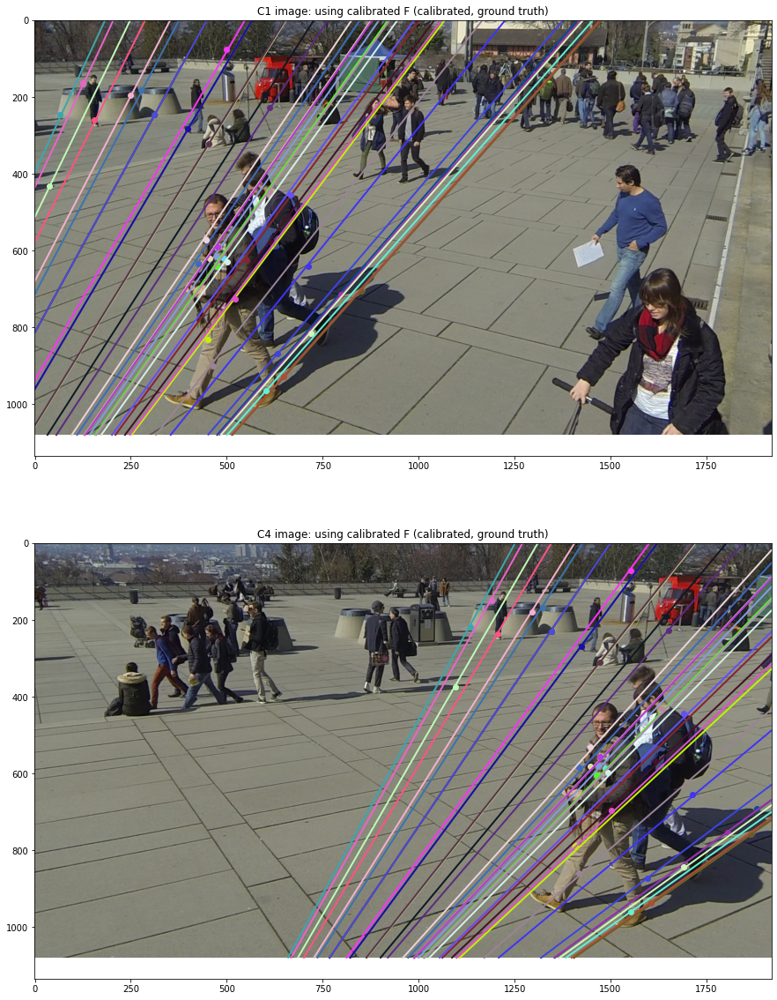

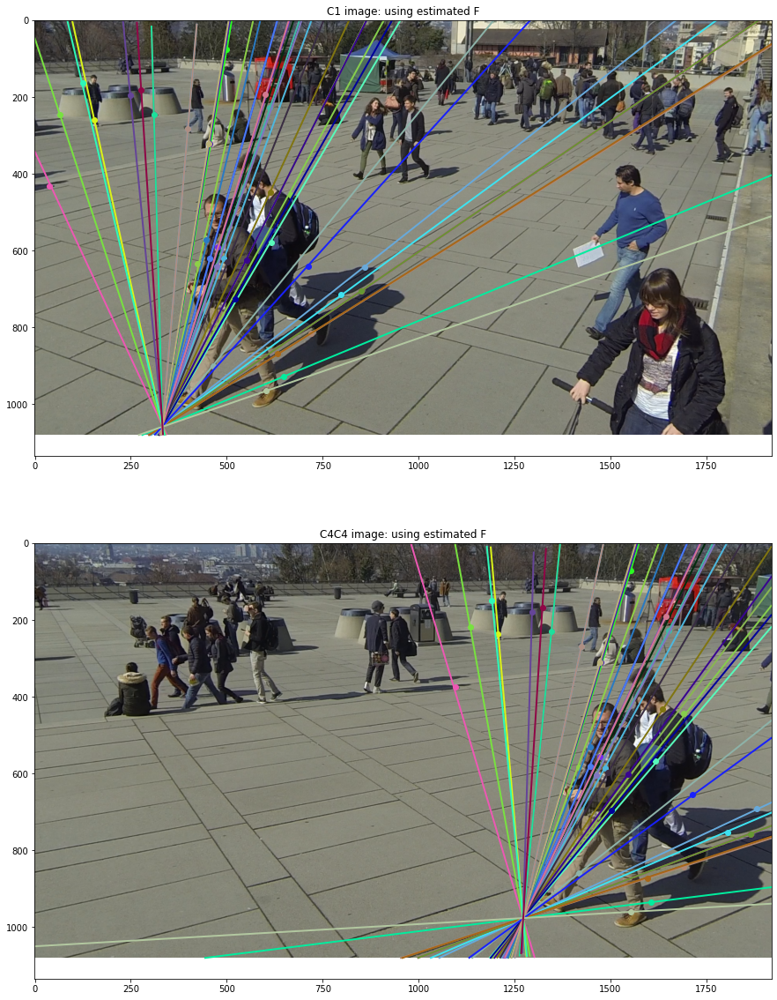

In [ ]:
def essential_mat_from_correspondences_RANSAC (X_left, K_left, X_right, K_right) :
    # X_left and X_right are 3 by N arrays of correspondence points (homogenous) from the left and right views 
    # K_left and K_right are 3 by 3 intrinsic parameter matrices from the left and right cameras
    # Returns: The essential and fundamental matrices estimates using RANSAC.
    #          It also returns the minimum distance from epipolar lines

    ind = np.arange(X_left.shape[1]) # total number of points
    d_min = 9999.0  # total distance from epipolar lines
    F_best = [] # best Fundamental matrix
    E_best = [] # best Esssential matrix
    ind_best = [] # indices for the point correspondeces that results in the best estimate
    for i in range (10000) : # do ransac over this many iterations -- 
        np.random.shuffle(ind)  # degenrates random shuffling of indices out of which first 9 will be selected to estimate the essential matrix
        X0_sample = X_left[:, ind[:9]]   # select first 9 correspondences
        X1_sample = X_right[:, ind[:9]]
        E_est, _ = estimate_essential_from_all_correspondences (X0_sample, K_list[c0], X1_sample, K_list[c1])
        # -- "fix" E_est to have [1, 1, 0] singular values, ignore for now as this is advanced material
        # U, D, VT = np.linalg.svd(E_est)
        # D[0] = 1; D[1] = 1; D[2] = 0
        # E_est = U @ np.diag(D) @ VT
        F_est = np.linalg.inv(K_list[c1]).transpose () @ E_est @ np.linalg.inv(K_list[c0])
        X0_test_sample = X_left[:, ind[9: ]] # select left over correspondences to compute error
        X1_test_sample = X_right[:, ind[9: ]]
        d = compute_epipolar_fit_error (F_est, X0_test_sample, X1_test_sample)
        if (d < d_min) :  # keep the best estimate (minimum distance) so far
            d_min = d;
            F_best = F_est
            E_best = E_est
            ind_best = ind[:9]

    error = compute_epipolar_fit_error (F_best, X_left, X_right)
    return (E_best, F_best, error)

#------------------------------------------------------------------------------
E_epipolar, F_epipolar, epiolar_error_ransac = essential_mat_from_correspondences_RANSAC (X_0_h, K_list[c0], X_1_h, K_list[c1])

print('Distance error for F (calibrated, ground truth)= {:0.3f} pixels'.format(epipolar_error_calib))
print('Distance error for F_epipolar= {:0.3f} pixels'.format(epiolar_error_ransac))
print('As comparison the norm error was = {:0.3f} pixels'.format(norm_error))

print('\nF (calibrated, ground truth)=\n', F_calib/F_calib[2,2], '\nF_epiolar =\n', F_epipolar/F_epipolar[2,2])

fig, ax = plt.subplots(2, 1)
fig.set_size_inches(20, 20)
ax[0].set_title (Cam[c0]+' image: using calibrated F (calibrated, ground truth)')
ax[1].set_title (Cam[c1]+' image: using calibrated F (calibrated, ground truth)')
plot_epipolar (F_calib, image_0, image_1, X_0_h, X_1_h, ax)

fig, ax = plt.subplots(2, 1)
fig.set_size_inches(20, 20)
ax[0].set_title (Cam[c0]+' image: using estimated F')
ax[1].set_title (Cam[c1]+'C4 image: using estimated F')
plot_epipolar (F_epipolar, image_0, image_1, X_0_h, X_1_h, ax)


#4.  Estimating $\mathbf{\hat{t}}$ from $\mathbf{E}$
* Note the columns of $\mathbf{E}$ are all orthogonal to $\mathbf{t}$ (WHY?), so **$\mathbf{t}^T\mathbf{E} = 0 $**. This means that one of the singular values will be zero. 



* The translation (direction only) solution is the left vector corresponding to the smallest singular value of the SVD decomposition. 

>>For a refresher on SVD, see the appendix of the book or 

>> https://web.mit.edu/be.400/www/SVD/Singular_Value_Decomposition.htm

* (Advanced: Recall the connection of epipoles to the translation vector. The translation vector that we seek takes a coordinate from the left camera into the right camera. This vector is defined w.r.t the right camera - should be in the opposite direction of the right epipole.)

* Let the SVD of $\mathbf{E}$ be denoted
\begin{equation}
\mathbf{E} = \mathbf{U} \Lambda \mathbf{V}^T =
    \begin{bmatrix}
    \mathbf{u}_0 & \mathbf{u}_1 & \mathbf{u}_2
    \end{bmatrix}
    \begin{bmatrix}
    \sigma_0 & & \\
    & \sigma_1 & \\
    & & \sigma_2 
    \end{bmatrix}
    \begin{bmatrix}
    \mathbf{v}_0^T \\ \mathbf{v}_1^T \\ \mathbf{v}_2^T
    \end{bmatrix}
\end{equation}

>>>>where $\sigma_0 > \sigma_1 > \sigma_2 $. 

* Ideally, $\sigma_2$ should be zero. So for a correct estimate of the essential matrix, we can set $\sigma_2=0$. And, $\mathbf{\hat{t}} = \mathbf{u}_2 =  $, the unit vector along the translation. 

\begin{equation}
\mathbf{E'} = \mathbf{U} \Lambda \mathbf{V}^T =
    \begin{bmatrix}
    \mathbf{u}_0 & \mathbf{u}_1 & \mathbf{\hat{t}}
    \end{bmatrix}
    \begin{bmatrix}
    \sigma_0 & & \\
    & \sigma_1 & \\
    & & 0 
    \end{bmatrix}
    \begin{bmatrix}
    \mathbf{v}_0^T \\ \mathbf{v}_1^T \\ \mathbf{v}_2^T
    \end{bmatrix}
\end{equation}

* **We can only recover the direction of the translation, not the magnitude. Impossible to recover distance between cameras without a real-world dimension. If we scale the world, we will get the same pairs of images.**

In [ ]:
def estimate_translation (E) :
    ''' returns translation vector from c_1 to c_0 in terms of coordinate axes at c_1
        There will uncertainty about the scale.'''
    U, D, VT = np.linalg.svd(E)
    #print('U=\n', U, '\nD=\n', D, '\nV^T=\n', VT, '\n\nE_fixed=\n', U @ np.diag([1, 1, 0]) @ VT)
    t = -U[:, 2] 
    return (t)
    
print('Essential matrix (calibration)=\n', E_calib)
print('Essential matrix (norm error)=\n', E_norm)
print('Essential matrix (epiolar error)=\n', E_epipolar)

t_calib = estimate_translation (E_calib)
t_norm = estimate_translation (E_norm)
t_epipolar = estimate_translation (E_epipolar)

print('\nT (calibrated, came with data, original)=\n', T_calib/np.linalg.norm(T_calib))
print('T (calibrated, reestimated from E_calib)=\n', t_calib)
print('T (norm error)=\n', t_norm)
print('T (epipolar error)=\n', t_epipolar)


Essential matrix (calibration)=
 [[ 5.9448 10.1736 -7.812 ]
 [-6.9039  0.8946 -9.8714]
 [ 8.3612  3.9693  4.4239]]
Essential matrix (norm error)=
 [[-0.1547 -0.6509  0.1138]
 [ 0.6721 -0.079   0.2053]
 [-0.0804  0.1698 -0.0633]]
Essential matrix (epiolar error)=
 [[ 0.1822  0.6478 -0.1656]
 [-0.6381  0.0805 -0.249 ]
 [ 0.1405 -0.1259  0.0928]]

T (calibrated, came with data, original)=
 [ 0.3372 -0.5941 -0.7303]
T (calibrated, reestimated from E_calib)=
 [ 0.3372 -0.5941 -0.7303]
T (norm error)=
 [-0.2298 -0.1676 -0.9587]
T (epipolar error)=
 [-0.1539 -0.2541 -0.9549]


# Assignment: Estimate of $\mathbf{t}$ from $\mathbf{E}$ 

Out of the two estimates of the translations (i) $t_{norm}$ based on minimizing the norm error and (ii) $t_{epipolar}$ based on minimizing the distance from epipolar lines, which estimate is better aligned (geometrically) with the calibrated translation estimate (the ground truth)? Hint: Compute the angles of these two estimates with respect to the ground truth estimate of the translation vector.


 

#5. (Advanced Material) Estimating $\mathbf{R}$ from $\mathbf{E}$

* We will solve for the rotation matrix by drawing a parallel between the SVD of $\mathbf{E}$  and the SVD of the product of a skew-symmetric matrix and orthonormal rotation matrix. 

* Ideally, in a noise-free world we can say one more thing about the singular values:  $\sigma_0 =  \sigma_1 = 1$. This is because (from Wikipedia): "Not every arbitrary $3\times 3$ matrix can be an essential matrix for some stereo cameras. To see this, notice that the essential matrix is defined as the matrix product of one rotation matrix and one skew-symmetric matrix, both $3\times 3$. **Any skew-symmetric matrix has two singular values, which are equal and another which is zero.** The multiplication of the rotation matrix does not change singular values. This means that the essential matrix also has two equal singular values and one which is zero. The properties described here are sometimes referred to as internal constraints of the essential matrix."

* Using this, we can further correct the essential matrix to

\begin{equation}
\mathbf{E''} = \mathbf{U} \Lambda \mathbf{V}^T =
    \begin{bmatrix}
    \mathbf{u}_0 & \mathbf{u}_1 & \mathbf{\hat{t}}
    \end{bmatrix}
    \begin{bmatrix}
    1& & \\
    & 1 & \\
    & & 0 
    \end{bmatrix}
    \begin{bmatrix}
    \mathbf{v}_0^T \\ \mathbf{v}_1^T \\ \mathbf{v}_2^T
    \end{bmatrix}
\end{equation}

* Next, let us consider the skew symmetric matrix $\mathbf{S}$. The skew symmetric property is: $\mathbf{S}^T = - \mathbf{S}$. The SVD of the skew symmetric matrix will have the following properties:
>> 1. The left singular vectors (i.e. the eigenvectors of $\mathbf{S} \mathbf{S}^T = - \mathbf{S}\mathbf{S}$) will be the same as the right singular vectors (i.e. the eignvectors of $\mathbf{S} \mathbf{S}^T = - \mathbf{S} \mathbf{S}$).
>> 2. The singular values will be square of the eigenvalues of $\mathbf{S}$. The eigenvalues of $\mathbf{S}$ can be shown to be $+ i, -i, 0$. We can derive this using $\det(\mathbf{S} - \lambda \mathbf{I}) = 0$. 

* So, the skew-symmetric matrix's singular values are $1, 1,$ and $0$. 

* The skew-symmetric matrix composed from the translation estimate be denoted by $[\mathbf{\hat{t}}]_{\times}$. By performing matrix multiplication, it is easy to show that $\hat{t}$ is both a left and right singular vector.

\begin{eqnarray}
\begin{bmatrix}
    0 & -\hat{t}_z & \hat{t}_y \\ \hat{t}_z & 0 & -\hat{t}_x \\ -\hat{t}_y & \hat{t}_x & 0
\end{bmatrix} 
\begin{bmatrix}
    \hat{t}_x \\ \hat{t}_y\\ \hat{t}_z
\end{bmatrix}  & = & 0 \\
\begin{bmatrix}
    \hat{t}_x & \hat{t}_y & \hat{t}_z
\end{bmatrix} 
\begin{bmatrix}
    0 & -\hat{t}_z & \hat{t}_y \\ \hat{t}_z & 0 & -\hat{t}_x \\ -\hat{t}_y & \hat{t}_x & 0
\end{bmatrix} 
 & = & 0 \\
\end{eqnarray}

* The other two singular vectors can be switched with each other (as their corresponding singular values are the same), and we can flip the signs of the vectors in the SVD without changing the decomposition.

* Thus, the SVD of the skew-symmetric cross-product matrix, $[\mathbf{\hat{t}}]_{\times}$,  can be expressed as

\begin{equation}
    [\mathbf{\hat{t}}]_{\times} = 
    \begin{bmatrix} \mathbf{s}_0 & \mathbf{s}_1 & \mathbf{t}  \end{bmatrix}
    \begin{bmatrix} 1 & & \\ & 1 & \\ & & 0 \end{bmatrix}
    \begin{bmatrix} 0 & -1 & \\ 1 & 0 & \\ & & 1 \end{bmatrix}
    \begin{bmatrix} \mathbf{s}_0^T \\ \mathbf{s}_1^T \\ \mathbf{t}^T \end{bmatrix}
\end{equation}

* Using this decomposition of the cross-product matrix, the essential matrix can also be expressed as

\begin{equation}
\mathbf{E} = \mathbf{\hat{t}} \times \mathbf{R} = 
\begin{bmatrix} \mathbf{s}_0 & \mathbf{s}_1 & \mathbf{\hat{t}} \end{bmatrix}
    \begin{bmatrix} 1 & & \\ & 1 & \\ & & 0 \end{bmatrix}
    \begin{bmatrix} 0 & -1 & \\ 1 & 0 & \\ & & 1 \end{bmatrix}
    \begin{bmatrix} \mathbf{s}_0^T \\ \mathbf{s}_1^T \\ \mathbf{\hat{t}}^T \end{bmatrix}
    \begin{bmatrix}  & & \\ & \mathbf{R} & \\ & & \end{bmatrix}
\end{equation}

* Compare this with the SVD of the $\mathbf{E} = \mathbf{U} \Lambda \mathbf{V}^T $ and choose $\mathbf{s}_0 = \mathbf{u}_0$ and $\mathbf{s}_1 = \mathbf{u}_1$. Then we can see the correspondence between the rotation matrix and rest of the expression.

\begin{eqnarray}
    \mathbf{R}_{90^0} \mathbf{U}^T \mathbf{R} & = & \mathbf{V}^T \\
    \mathbf{R} & = & \mathbf{U}\mathbf{R}_{90^0}^T \mathbf{V}^T
\end{eqnarray}

* Possible four solutions of rotation matrix: the $\mathbf{R}_{90^0}$ can also be a rotation the other way, $\mathbf{R}_{-90^0}$ and the signs of the eigenvectors can be flipped in the SVD without change the decomposition.

\begin{equation}
    \mathbf{R} = \pm \mathbf{U}\mathbf{R}_{\pm 90^0}^T \mathbf{V}^T
\end{equation}

>> where

\begin{equation}
   \mathbf{R}_{90^0} = 
   \begin{bmatrix} 0 & -1 & \\ 1 & 0 & \\ & & 1 \end{bmatrix}
\end{equation}

>> and

\begin{equation}
   \mathbf{R}_{-90^0} = 
   \begin{bmatrix} 0 & 1 & \\ -1 & 0 & \\ & & 1 \end{bmatrix}
\end{equation}

* Keep the two estimates of $\mathbf{R}$ whose determinant $\det{\mathbf{R}}=1$. Pair them with two possibilities of the translation vector $\pm \mathbf{t}$ to arrive at 4 possible combinations. 

* Use these estimates of the camera transformation to estimate the coordinates of the corresponding pixel pairs. Pick the camera transformation for which we get the most positive $z$-coordinates (a condition is also known as **chirality**).

>>> https://en.wikipedia.org/wiki/Essential_matrix



In [ ]:
def estimate_rotation (E) :
    ''' returns translation vector from c_1 to c_0 in terms of coordinate axes at c_2
        There will uncertainty about the scale.'''
    #print('Essential matrix=\n', E)
    U, D, VT = np.linalg.svd(E)

    # matrices used to swap rows of rotation matrix
    R_90  = np.array([[0, -1, 0], [1, 0, 0], [0, 0, 1]])
    R__90 = np.array([[0, 1, 0], [-1, 0, 0], [0, 0, 1]])

    #Four possibilities are stored in a 3 dimensional matrix 4 by 3 by 3
    four_R = np.zeros((4,3,3))
    four_R[0] = U @ R_90.transpose() @ VT
    four_R[1] = -U @ R_90.transpose() @ VT
    four_R[2] = U @ R__90.transpose() @ VT
    four_R[3] = -U @ R__90.transpose() @ VT
    # find the two combination with positive determinant and store in out_R to return
    out_R = np.zeros((2,3,3)); ind=0
    for i in range(4) :
       if np.linalg.det(four_R[i]) > 0 :
           out_R[ind] = four_R[i]
           ind += 1
   
    # since we are computing the SVD of E -- we can also return the translation estimate
    t = -U[:, 2]
    return (out_R, t)

#---------------------------------------------------

print('Rotation matrix (calibration)=\n', R_calib)
two_Rs, _ = estimate_rotation (E_calib) # using grouth truth (calibrated) essential matrix
print('\n-------------------------------------')
for i in range(2) :
    print('R_calib{}=\n{}'.format(i, two_Rs[i]))
print('\n-------------------------------------')

two_Rs, _ = estimate_rotation (E_norm) # using norm error minimized essential matrix
for i in range(2) :
    print('R_norm{}=\n{}'.format(i, two_Rs[i]))
print('\n-------------------------------------')
R_norm = two_Rs[1]

two_Rs, _ = estimate_rotation (E_epipolar) # using epipolar distance minimized essential matrix
for i in range(2) :
    print('R_epiolar{}=\n{}'.format(i, two_Rs[i]))
R_epipolar = two_Rs[0]



Rotation matrix (calibration)=
 [[ 0.8579 -0.117   0.5004]
 [ 0.1398  0.9902 -0.008 ]
 [-0.4945  0.0768  0.8658]]

-------------------------------------
R_calib0=
[[ 0.8579 -0.117   0.5004]
 [ 0.1398  0.9902 -0.008 ]
 [-0.4945  0.0768  0.8658]]
R_calib1=
[[-0.4752 -0.3441 -0.8098]
 [-0.8139 -0.1776  0.5532]
 [-0.3342  0.922  -0.1957]]

-------------------------------------
R_norm0=
[[-0.9753  0.2074 -0.0755]
 [-0.2207 -0.915   0.3377]
 [ 0.001   0.346   0.9382]]
R_norm1=
[[ 0.8557 -0.1035  0.507 ]
 [ 0.1335  0.9908 -0.023 ]
 [-0.4999  0.0874  0.8617]]

-------------------------------------
R_epiolar0=
[[ 0.8561 -0.1075  0.5055]
 [ 0.1357  0.9906 -0.0192]
 [-0.4987  0.085   0.8626]]
R_epiolar1=
[[-0.9515  0.2049 -0.2295]
 [-0.2932 -0.8298  0.4748]
 [-0.0932  0.519   0.8497]]


# Assignment: Estimate of $\mathbf{R}$ from $\mathbf{E}$ 

Compute the Euler angles corresponding to the three rotation matrices above: (i) the calibration rotation matrix, which is the ground truth; (ii) the rotation matrix based on minimizing the norm error, and (iii) the rotation matrix based on minimizing the distance from epipolar lines. Based on these angles, which estimate is better (ii) or (iii)?


 

In [ ]:
R = Rotation.from_matrix(R_calib)
print(R.as_euler('zyx', degrees=True))

R = Rotation.from_matrix(R_norm)
print(R.as_euler('zyx', degrees=True))

R = Rotation.from_matrix(R_epipolar)
print(R.as_euler('zyx', degrees=True))

[ 7.7688 30.0261  0.53  ]
[ 6.8959 30.4619  1.5298]
[ 7.1561 30.3634  1.2725]
